# import funcs and load Data

In [2]:
import numpy as np
import pandas as pd
from scipy import interpolate

import xarray as xr
import dask.array as da
from dask.distributed import Client

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches # for creating legend
import matplotlib.dates as mdates # converts datetime64 to datetime

import cartopy
import cartopy.crs as ccrs # for plotting
import cartopy.feature as cfeature # for map features
from cartopy.util import add_cyclic_point # for wrapping map fully - avoiding white line on 0 deg
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import matplotlib.dates as mdates # converts datetime64 to datetime
import matplotlib.gridspec as gridspec # to create grid-shaped combos of axes
from mpl_toolkits import mplot3d # 3d plotting tool
import cmocean # for nice oceanography colour pallettes

#import argopy
#from argopy import DataFetcher as ArgoDataFetcher # to load Argo ds directly

import os # for finding files

import gsw # for conversion functions

from tqdm.notebook import tqdm_notebook as tqdm
import glob # for downloading data
import sys # for path to functions

import seaborn as sns

sns.set(#font='Franklin Gothic Book',
        rc={
         'axes.axisbelow': False,
         'axes.edgecolor': 'Black',
         'axes.facecolor': 'w', 
                            # '#aeaeae',
         'axes.grid': False,
         'axes.labelcolor': 'k',
         'axes.spines.right': True,
         'axes.spines.top': True,
         'figure.facecolor': 'white',
         'lines.solid_capstyle': 'round',
         'patch.edgecolor': 'k',
         'patch.force_edgecolor': True,
         'text.color': 'k',
         'xtick.bottom': True,
         'xtick.color': 'k',
         'xtick.direction': 'out',
         'xtick.top': False,
         'ytick.color': 'k',
         'ytick.direction': 'out',
         'ytick.left': True,
         'ytick.right': False},
         font_scale=1)
mpl.rcParams["figure.titlesize"] = 30
mpl.rcParams["axes.titlesize"] = 25
mpl.rcParams["axes.labelsize"] = 20
mpl.rcParams["font.size"] = 12
mpl.rcParams["xtick.labelsize"] = 15
mpl.rcParams["ytick.labelsize"] = 15
mpl.rcParams["ytick.labelright"] = False

from warnings import filterwarnings as fw
fw('ignore')

In [3]:
mpl.rcParams["figure.titlesize"] = 25
mpl.rcParams["axes.titlesize"] = 25
mpl.rcParams["axes.labelsize"] = 20
mpl.rcParams["font.size"] = 17.5
mpl.rcParams["xtick.labelsize"] = 17.5
mpl.rcParams["ytick.labelsize"] = 17.5
mpl.rcParams["ytick.labelright"] = False

In [4]:
import importlib
#importlib.reload(sys.modules['load_data'])

path = '/home/theospira/notebooks/projects/WW_climatology'

import sys
sys.path.append(path+'/functions')
from plot_formatting import *
from inspection_funcs import boxplot
from smoothing_and_interp import *

from load_data import load_data
# load data
ds, ds_s, ds_ww, bth, ssh, si, szn = load_data(path+'/data/hydrographic_profiles/submission2/SO_1yr_clim_seasonal.nc')

# Density-SSH mapping

([<matplotlib.axis.YTick at 0x7f5eb212af90>,
 [Text(0, -70, '−70'), Text(0, -60, '−60'), Text(0, -50, '−50')])

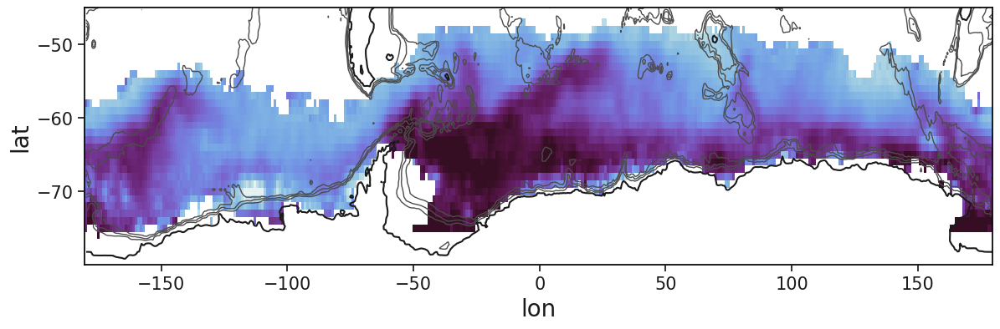

In [3]:
plt.figure(figsize=(14,4),dpi=100)

ds_ww.sig_c.mean('season').plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,)

# plot bathym features
bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',
                           linestyles=['-'],linewidths=[1],alphas=[0.9],)

# plot coastline
bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],)

plt.xlabel('lon')
plt.ylabel('lat')
plt.ylim(-80,-45)
plt.yticks(np.arange(-70,-40,10))

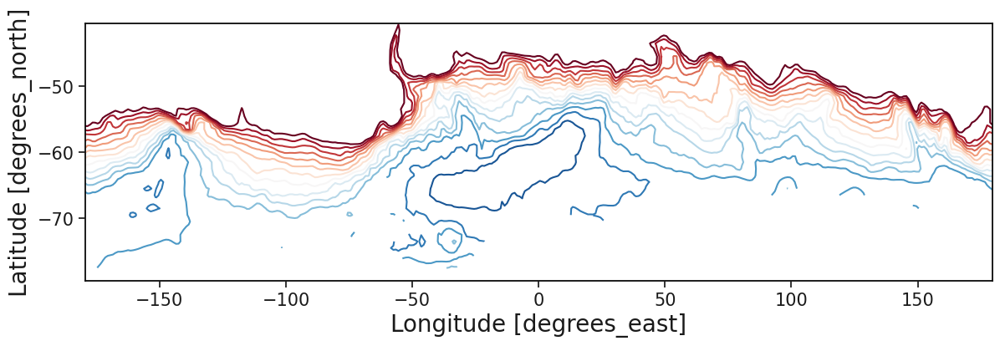

In [12]:
ssh.adt.mean('season').plot.contour(x='lon',levels=np.arange(-1.5,0,0.1),figsize=(14,4))

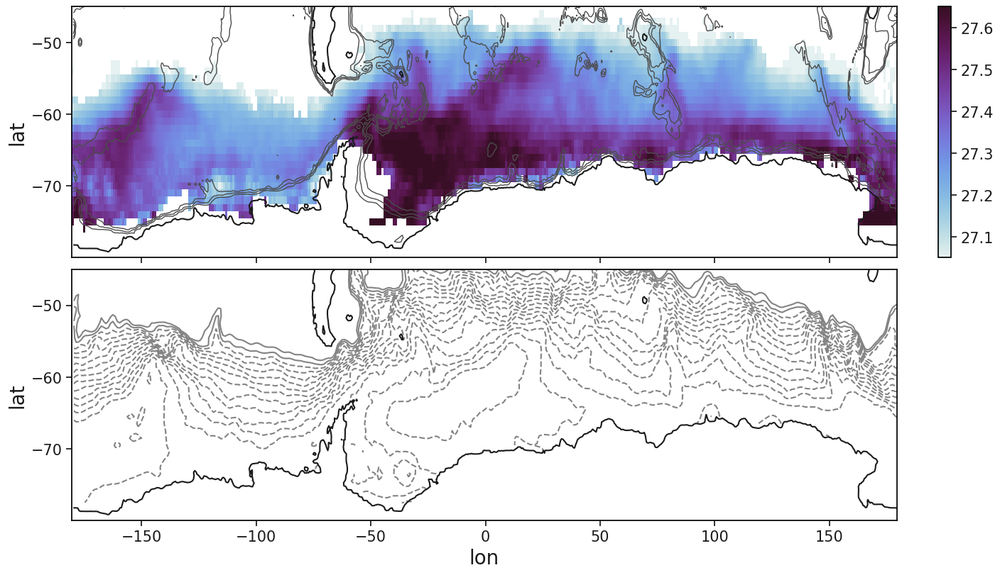

In [37]:
fig,ax = plt.subplots(2,1,figsize=[14,8],constrained_layout=True,sharex='col',sharey='row',) #dpi=500)
ax = ax.flatten()

hmp = ds_ww.sig.mean('season').plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,ax=ax[0])
# plot bathym features
bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',linestyles=['-'],linewidths=[1],alphas=[0.9],ax=ax[0])

ssh.adt.mean('season').plot.contour(x='lon',levels=np.arange(-1.5,0.2,0.1),colors='#838383',ax=ax[1])

for a in ax:
    # plot coastline
    bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],ax=a)

    a.set_xlabel('')
    a.set_ylabel('lat')
    a.set_ylim(-80,-45)
    a.set_yticks(np.arange(-70,-40,10))
    
ax[-1].set_xlabel('lon')

fig.colorbar(hmp,ax=ax[0],)

Text(0.5, 0, 'lon')

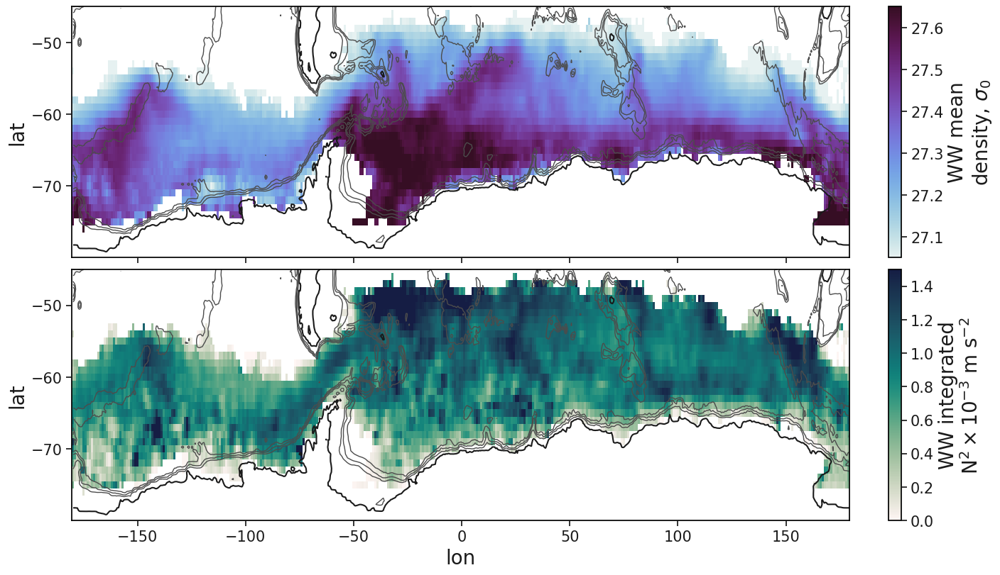

In [81]:
fig,ax = plt.subplots(2,1,figsize=[14,8],constrained_layout=True,sharex='col',sharey='row',) #dpi=500)
ax = ax.flatten()

hmp = ds_ww.sig.mean('season').plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,ax=ax[0])
fig.colorbar(hmp,ax=ax[0],label='WW mean''\n''density, $\sigma_0$')

hmp = (ds_ww.ww_n2_int.mean('season')*1e3).plot(x='lon',vmin=0,vmax=1.5,cmap='cmo.tempo',add_colorbar=False,ax=ax[1])
fig.colorbar(hmp,ax=ax[1],label='WW integrated''\n'r'N$^2 \times 10^{-3}$ m s$^{-2}$')

for a in ax:
    # plot coastline
    bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],ax=a)
    bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',linestyles=['-'],linewidths=[1],alphas=[0.9],ax=a)

    a.set_xlabel('')
    a.set_ylabel('lat')
    a.set_ylim(-80,-45)
    a.set_yticks(np.arange(-70,-40,10))
    
ax[-1].set_xlabel('lon')

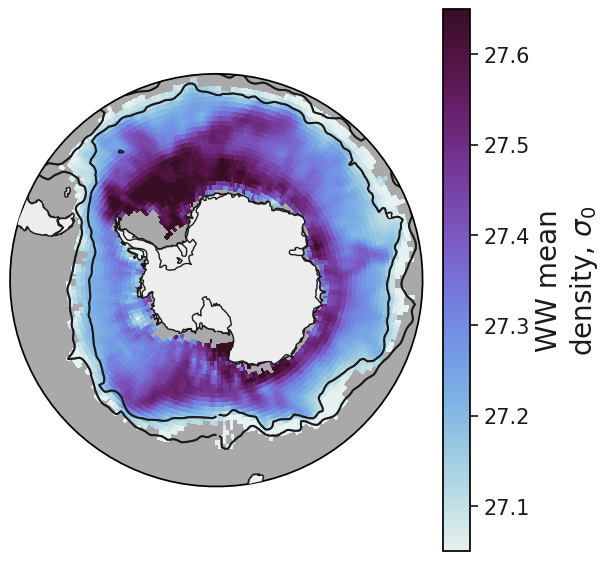

In [83]:
crs = ccrs.PlateCarree()

fig,ax = plt.subplots(1,1,figsize=[6,5.5],constrained_layout=True,#dpi=500,
                      subplot_kw={'projection':ccrs.SouthPolarStereo(),'facecolor':'darkgrey'})
#ax=ax.flatten()

fs = 20   # fontsize
asp = 12  # aspect for colorbars
si_x = 15 # sea ice concentration contour

circular_plot_fomatting(fig,ax,ds,bathym=False,sea_ice=False)
#circular_boundary(ax)

# plot coastline
bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.25],ax=ax,transform=crs)
bth.elevation.where(bth.elevation>0).plot(x='lon',levels=[0],colors='#ededed',add_colorbar=False,ax=ax,transform=crs)
ds.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1],ax=ax,transform=crs)
#ssh.eke.where(ssh.adt<-0.58)
hmp = ds_ww.sig.mean('season').plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,ax=ax,transform=crs)
fig.colorbar(hmp,ax=ax,label='WW mean''\n''density, $\sigma_0$')

## load ssh data

In [4]:
from load_data import seasonal_grouping
ssh = xr.open_dataset('/home/theospira/notebooks/data/Copernicus/ssh_monthly_climatology_2004-2021.nc')
ssh = seasonal_grouping(ssh).mean('month').rename({'month_bins':'season'})

In [5]:
ssh['eke'] = np.sqrt(ssh.ugos**2 + ssh.vgos**2)

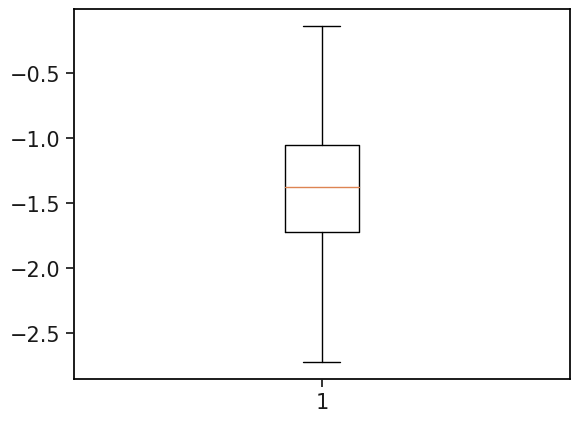

In [36]:
boxplot(np.log10(ssh.eke.mean('season').sel(lat=slice(-80,-45))))

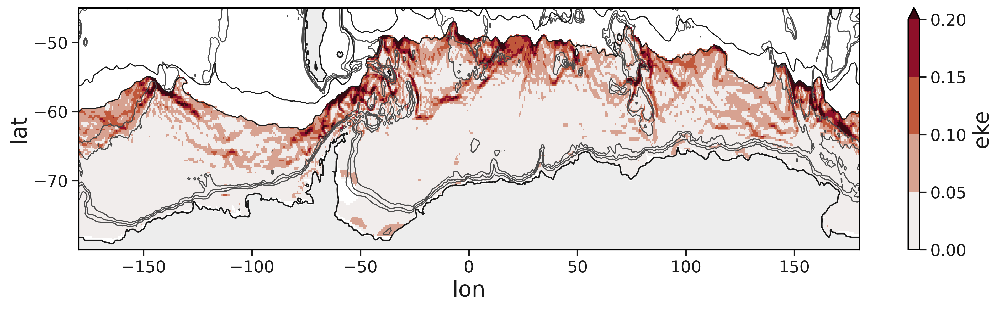

In [10]:
plt.figure(figsize=(16,4),dpi=300,)

ssh.eke.where(ssh.adt<-0.58).mean('season').sel(lat=slice(-80,-45)
                ).plot(x='lon',vmin=0,vmax=0.2,cmap='cmo.amp',levels=5)
#ssh.adt.mean('season').plot.contour(x='lon',levels=(-0.1))

# plot bathym features
bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',
                           linestyles=['-'],linewidths=[1],alphas=[0.9],)

# plot coastline
bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.25],)
bth.elevation.where(bth.elevation>0).plot(x='lon',levels=[0],colors='#ededed',add_colorbar=False)
ssh.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1])



plt.xlabel('lon')
plt.ylabel('lat')
plt.ylim(-80,-45)
plt.yticks(np.arange(-70,-40,10))

plt.show()

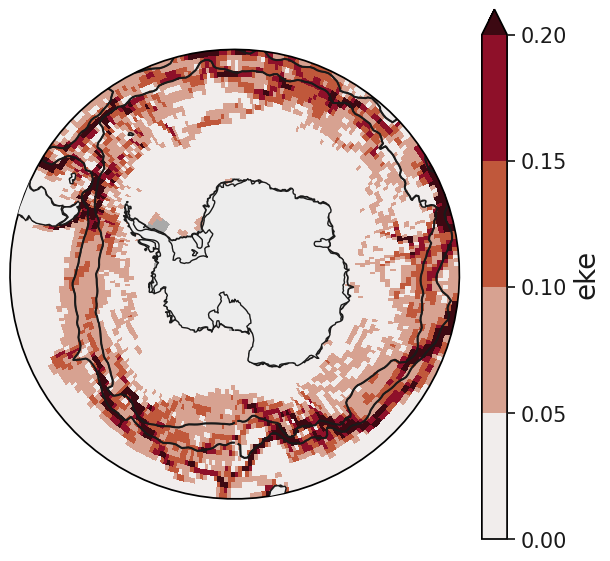

In [72]:
crs = ccrs.PlateCarree()

fig,ax = plt.subplots(1,1,figsize=[6,5.5],constrained_layout=True,#dpi=500,
                      subplot_kw={'projection':ccrs.SouthPolarStereo(),'facecolor':'darkgrey'})
#ax=ax.flatten()

fs = 20   # fontsize
asp = 12  # aspect for colorbars
si_x = 15 # sea ice concentration contour

circular_plot_fomatting(fig,ax,ds,bathym=False,sea_ice=False)
#circular_boundary(ax)

# plot coastline
bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.25],ax=ax,transform=crs)
bth.elevation.where(bth.elevation>0).plot(x='lon',levels=[0],colors='#ededed',add_colorbar=False,ax=ax,transform=crs)
ds.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1],ax=ax,transform=crs)
#ssh.eke.where(ssh.adt<-0.58)
ssh.eke.mean('season').sel(lat=slice(-80,-45)
                ).plot(x='lon',vmin=0,vmax=0.2,cmap='cmo.amp',levels=5,ax=ax,transform=crs)

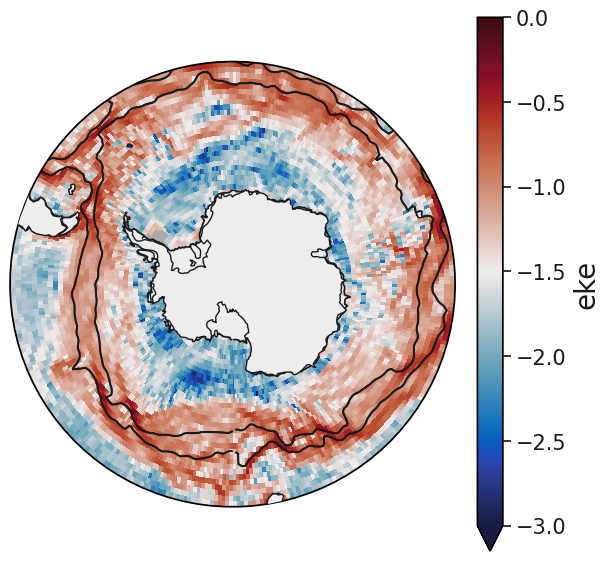

In [77]:
crs = ccrs.PlateCarree()

fig,ax = plt.subplots(1,1,figsize=[6,5.5],constrained_layout=True,#dpi=500,
                      subplot_kw={'projection':ccrs.SouthPolarStereo(),'facecolor':'darkgrey'})
#ax=ax.flatten()

fs = 20   # fontsize
asp = 12  # aspect for colorbars
si_x = 15 # sea ice concentration contour

circular_plot_fomatting(fig,ax,ds,bathym=False,sea_ice=False)
#circular_boundary(ax)

# plot coastline
bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.25],ax=ax,transform=crs)
bth.elevation.where(bth.elevation>0).plot(x='lon',levels=[0],colors='#ededed',add_colorbar=False,ax=ax,transform=crs)
ds.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1],ax=ax,transform=crs)
#ssh.eke.where(ssh.adt<-0.58)
np.log10(ssh.eke.mean('season').sel(lat=slice(-80,-45))
                ).plot(x='lon',vmin=-3,vmax=0,cmap='cmo.balance',ax=ax,transform=crs,) #levels=5)

In [30]:
type(ax)!=np.ndarray

True

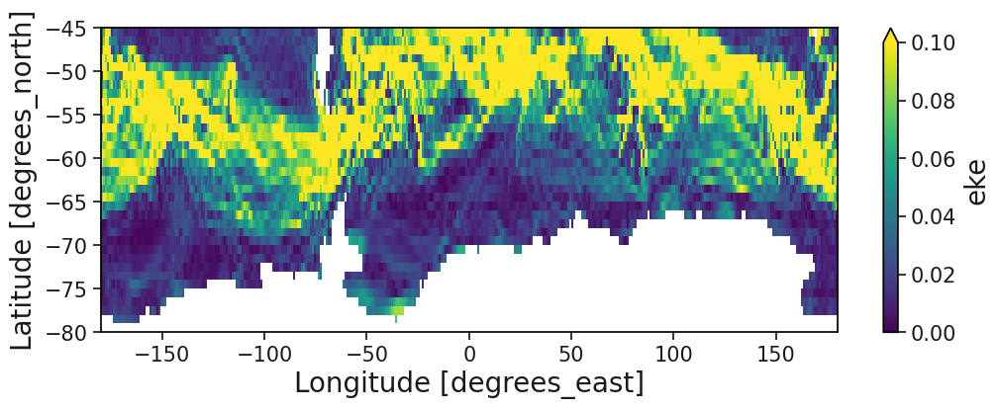

In [30]:
np.log10(ssh.eke.mean('season').sel(lat=slice(-80,-45))).plot(x='lon',vmin=0,vmax=0.1,figsize=(14,4))

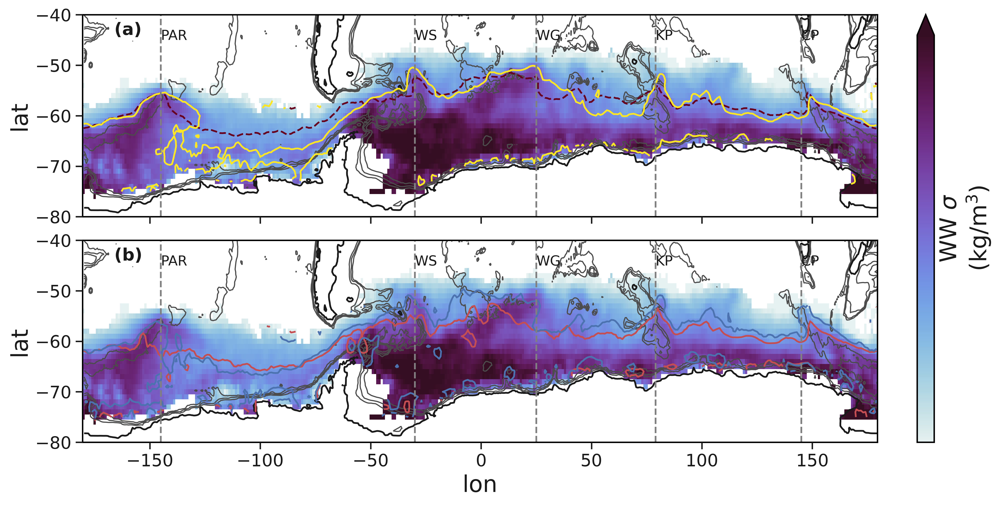

In [12]:
tmp = ds_ww.sig.mean('season')

#plt.figure(dpi=300,figsize=(12,3))
fig,ax = plt.subplots(2,1,figsize=[12,6],constrained_layout=True,dpi=500,sharex='col',sharey='row')
ax = ax.flatten()

for i,a in enumerate(ax):
    # plot WW n2 with CT and SA contoured
    hmp = tmp.plot(ax=a,x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False)


    # plot bathym features
    bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',
                               linestyles=['-'],linewidths=[1],alphas=[0.9],ax=a)

    # plot coastline
    bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],ax=a)
    
    # identify key bathymetry features
    a.axes.axvline(-145,ls='--',c='grey')
    a.axes.axvline(-30, ls='--',c='grey')
    a.axes.axvline(25,  ls='--',c='grey')
    a.axes.axvline(79,  ls='--',c='grey')
    a.axes.axvline(145, ls='--',c='grey')

    a.axes.annotate('PAR',(-145,-45))
    a.axes.annotate('WS',(-30,-45))
    a.axes.annotate('WG',(25,-45))
    a.axes.annotate('KP',(79,-45))
    a.axes.annotate('CP',(145,-45))
    
    a.set_ylim(-80,-40)
    a.set_ylabel('lat')
    
    # add annotation for each subfig
    a.text(x=0.04,y=.9,s="(" + alphbt[i] + ")",transform=a.transAxes,fontsize=15,weight='bold')

ct = ds_ww.ww_ct.mean('season')
ct.plot.contour(x='lon',levels=[(ct.mean()+0.25*ct.std()
                                ).values],ax=ax[0]) # levels previously 0
sa = ds_ww.ww_sa.mean('season')
sa.plot.contour(x='lon',levels=[(sa.mean()-0.25*sa.std()
                                ).values],ax=ax[0]) # levels previously 34.25

# add depth and thickness contours
cp = ds_ww.ww_cp.mean('season')
cp.plot.contour(x='lon',levels=[(cp.mean()-0.25*cp.std()
                                ).values],ax=ax[1],colors='r',)
thcc = ds_ww.thcc.mean('season')
thcc.plot.contour(x='lon',levels=[(thcc.mean()-0.25*sa.std()
                                ).values],ax=ax[1],colors='b')

ax[0].set_xlabel('')
ax[1].set_xlabel('lon')

cb = fig.colorbar(hmp,label=r'WW $\sigma$''\n''(kg/m$^3$)',extend='max',ax=ax,aspect=asp*2)
cb.set_ticks(np.arange(0,2,0.5))

# map density onto ssh

In [5]:
bins = 0.1                           # ssh bin size 
ctrs = np.arange(-1.5,0.2+bins,bins) # ssh contour binning

ssh_sig = np.ndarray([360,ctrs.size])*np.nan
ssh_sic = np.ndarray([360,ctrs.size])*np.nan

sig = ds_ww.sig_c.mean('season')
ice = wrap_smth_var(ds.sic.mean('season'))
adt = ds.adt.mean('season')

for i in tqdm(range(360)):
    for j in range(ds.lat.size):
        for h in range(ctrs.size - 1):
            # check if there is data within contours
            idx = np.where((adt[:,i] >= ctrs[h]) & (adt[:,i] <  ctrs[h+1]))[0]

            if idx.size != 0:
                ssh_sig[i,h] = sig.isel(lon=i,lat=idx).mean(skipna=True).data
                ssh_sic[i,h] = ice.isel(lon=i,lat=idx).mean(skipna=True).data

ds_ssh = xr.Dataset(
            data_vars = dict(sig_c   = (['lon','adt'], ssh_sig),
                             sic     = (['lon','adt'], ssh_sic),
                            ),
            coords   = dict(
                            lon     = (['lon'], ds.lon.data),
                            adt     = (['adt'], ctrs,
                            ),
 #           attrs    = dict(description=str(
#    '1 degree grid of median along 2dbar pressure interpolated monthly time series data from Argo, MEOP, SOCCOM, CTDs, and Gliders.'))
            ))

ds_ssh.to_netcdf(f'ssh_smth_{bins}m_adt.nc')

  0%|          | 0/360 [00:00<?, ?it/s]

In [4]:
bins = 0.15                           # ssh bin size 
ctrs = np.arange(-1.5,0.2+bins,bins) # ssh contour binning

ssh_sig = np.ndarray([360,ctrs.size])*np.nan
ssh_sic = np.ndarray([360,ctrs.size])*np.nan

sig = ds_ww.sig_c.mean('season')
ice = wrap_smth_var(ds.sic.mean('season'))
adt = ds.adt.mean('season')

for i in tqdm(range(360)):
    for j in range(ds.lat.size):
        for h in range(ctrs.size - 1):
            # check if there is data within contours
            idx = np.where((adt[:,i] >= ctrs[h]) & (adt[:,i] <  ctrs[h+1]))[0]

            if idx.size != 0:
                ssh_sig[i,h] = sig.isel(lon=i,lat=idx).mean(skipna=True).data
                ssh_sic[i,h] = ice.isel(lon=i,lat=idx).mean(skipna=True).data

ds_ssh2 = xr.Dataset(
            data_vars = dict(sig_c   = (['lon','adt'], ssh_sig),
                             sic     = (['lon','adt'], ssh_sic),
                            ),
            coords   = dict(
                            lon     = (['lon'], ds.lon.data),
                            adt     = (['adt'], ctrs,
                            ),
 #           attrs    = dict(description=str(
#    '1 degree grid of median along 2dbar pressure interpolated monthly time series data from Argo, MEOP, SOCCOM, CTDs, and Gliders.'))
            ))

ds_ssh2.to_netcdf(f'ssh_smth_{bins}m_adt.nc')

  0%|          | 0/360 [00:00<?, ?it/s]

In [7]:
ds_ssh = ds_ssh2.copy()

## plot

In [4]:
ds_ssh = xr.open_dataset(f'ssh_smth_0.1m_adt.nc')

In [3]:
ds_ssh2 = xr.open_dataset(f'ssh_smth_0.15m_adt.nc')

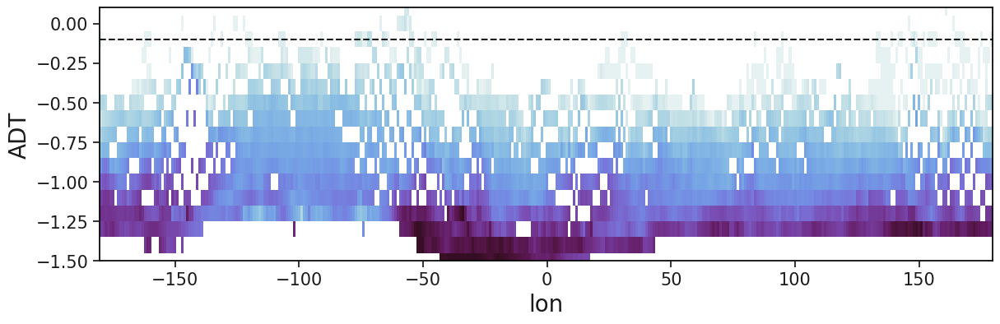

In [35]:
plt.figure(figsize=(14,4),dpi=100)

ds_ssh.sig.plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,)

plt.xlabel('lon')
plt.ylabel('ADT')
plt.ylim(-1.5,0.1)
plt.yticks(np.arange(-1.5,0.1,0.25))

plt.axhline(-0.1,c='k',ls='--')

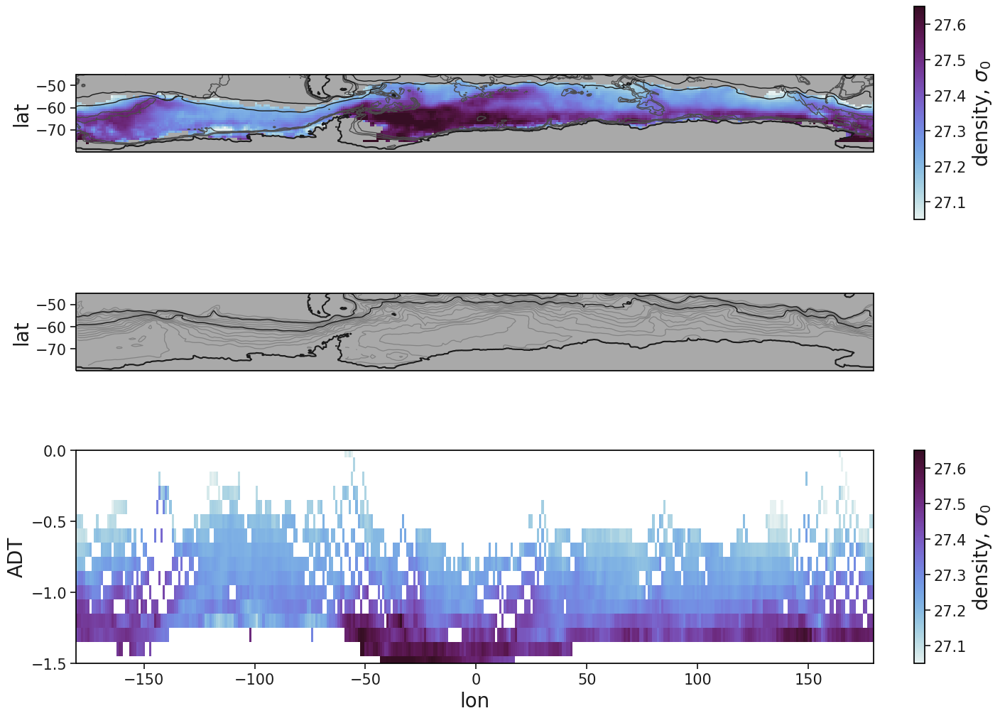

In [29]:
fig,ax = plt.subplots(3,1,figsize=[14,10],constrained_layout=True,sharex='col',sharey='row',
                     subplot_kw={'projection':ccrs.PlateCarree(),'facecolor':'darkgrey'}) #dpi=500)
ax = ax.flatten()

sig_kwargs = dict(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,) #levels=7)

hmp = ds_ww.sig_c.mean('season').plot(**sig_kwargs,ax=ax[0])
fig.colorbar(hmp,ax=ax[0],label='density, $\sigma_0$')
# plot bathym features
bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#4c4c4c',linestyles=['-'],linewidths=[1],alphas=[0.9],ax=ax[0])

# plot adt
ssh.adt.mean('season').plot.contour(x='lon',levels=np.arange(-1.5,0.2,0.1),
                                    colors='#838383',linestyles='-',linewidths=0.9,ax=ax[1])

update_projection(ax,ax[2],'rectilinear')
hmp = ds_ssh.sig_c.plot(**sig_kwargs,ax=ax[2])
fig.colorbar(hmp,ax=ax[2],label='density, $\sigma_0$')

for i,a in enumerate(ax):
    # plot coastline
    if i!=2:
        bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],ax=a)
        ds.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1],ax=a)
                
    a.set_xlabel('')
    a.set_ylabel('lat')
    a.set_ylim(-80,-45)
    a.set_yticks(np.arange(-70,-40,10))
    
ax[-1].set_xlabel('lon')
ax[-1].set_ylabel('ADT')
ax[-1].set_ylim(-1.5,0)
ax[-1].set_yticks(np.arange(-1.5,0.1,0.5))

fig.show()

In [4]:
ds_ssh2 = xr.open_mfdataset('ssh_smth_0.15m_adt.nc')

In [44]:
ice[0]
b.collections[0]
adt.collections[0]

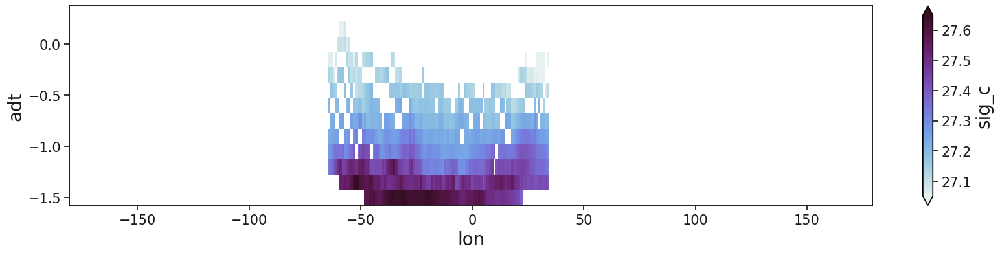

In [ ]:
ds_ssh2.sig_c.where(np.logical_and(ds_ssh2.lon<35,ds_ssh2.lon>-65)).plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',figsize=(20,4))

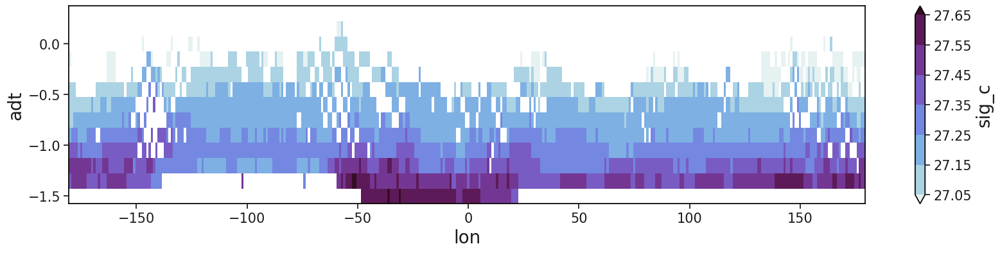

In [ ]:
vmax=0.2
ds_ssh2.sig_c.plot(x='lon',figsize=(20,4),vmin=27.05,vmax=27.65,cmap='cmo.dense',levels=7)

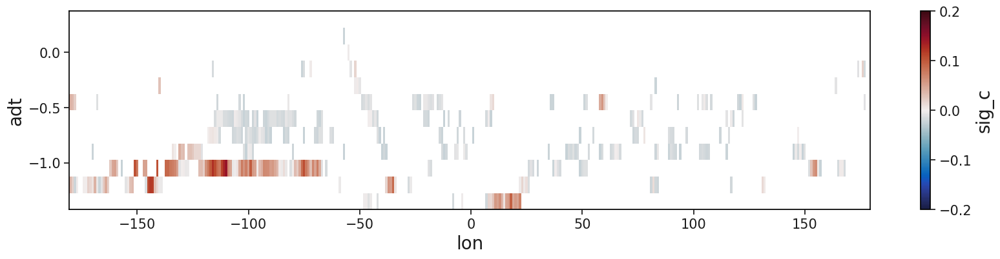

In [ ]:
vmax=0.2
ds_ssh2.sig_c.diff('adt').where(ds_ssh2.sig_c.diff('adt')>-0.025).plot(x='lon',figsize=(20,4),vmin=-vmax,vmax=vmax,cmap='cmo.balance') #vmin=27.05,vmax=27.65,cmap='cmo.dense',levels=7)

In [ ]:
print(np.nanmean(ds_ww.sig_c.where(np.logical_and(ds_ww.lon<35,ds_ww.lon>-65))))
np.nanstd(ds_ww.sig_c.where(np.logical_and(ds_ww.lon<35,ds_ww.lon>-65)))

27.42955684154283


0.17150505514091088

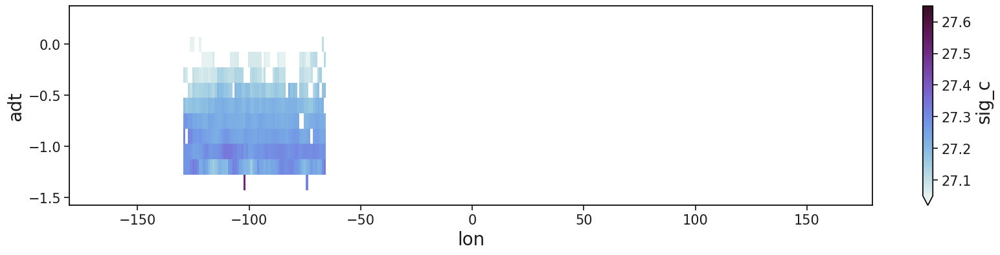

In [ ]:
ds_ssh2.sig_c.where(np.logical_and(ds_ssh2.lon<-65,ds_ssh2.lon>-130)).plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',figsize=(20,4))

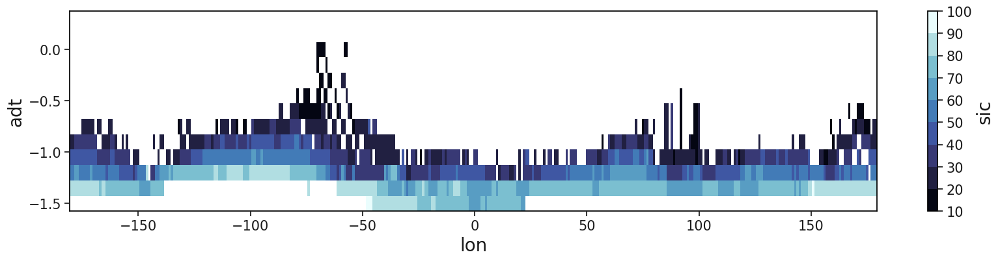

In [7]:
ds_ssh2.sic.plot(x='lon',cmap='cmo.ice',figsize=(20,4),levels=11)

In [20]:
wrap_smth_var((ds_ssh2.sic - si_x).__abs__().idxmin(dim='adt'))

<xarray.DataArray (lon: 360)>
array([-8.0000000e-01, -8.5000000e-01, -9.0000000e-01, -9.0000000e-01,
       -9.0000000e-01, -8.5000000e-01, -8.0000000e-01, -7.5000000e-01,
       -7.5000000e-01, -7.5000000e-01, -7.5000000e-01, -8.0000000e-01,
       -8.0000000e-01, -8.0000000e-01, -8.0000000e-01, -8.5000000e-01,
       -9.0000000e-01, -8.5000000e-01, -8.0000000e-01, -8.0000000e-01,
       -8.5000000e-01, -9.5000000e-01, -1.0000000e+00, -1.0000000e+00,
       -1.0000000e+00, -9.5000000e-01, -1.0000000e+00, -1.0500000e+00,
       -1.1000000e+00, -1.1000000e+00, -1.0500000e+00, -1.1000000e+00,
       -1.1500000e+00, -1.2000000e+00, -1.2500000e+00, -1.3000000e+00,
       -1.3000000e+00, -1.1500000e+00, -1.1000000e+00, -1.0500000e+00,
       -1.0500000e+00, -9.5000000e-01, -1.0000000e+00, -1.0500000e+00,
       -1.1000000e+00, -1.1000000e+00, -1.1000000e+00, -1.1000000e+00,
       -9.5000000e-01, -8.5000000e-01, -8.0000000e-01, -8.5000000e-01,
       -8.5000000e-01, -8.0000000e-01, -8.0000000e-01, -8.5000000e-01,
       -9.0000000e-01, -9.0000000e-01, -9.0000000e-01, -9.0000000e-01,
       -9.0000000e-01, -9.0000000e-01, -9.0000000e-01, -9.0000000e-01,
       -9.0000000e-01, -8.5000000e-01, -8.5000000e-01, -8.0000000e-01,
       -8.0000000e-01, -7.5000000e-01, -7.5000000e-01, -8.0000000e-01,
       -8.0000000e-01, -8.0000000e-01, -7.5000000e-01, -8.0000000e-01,
       -8.5000000e-01, -8.5000000e-01, -8.0000000e-01, -8.0000000e-01,
...
       -9.0000000e-01, -1.0000000e+00, -1.1000000e+00, -1.1000000e+00,
       -1.1000000e+00, -1.1000000e+00, -1.1500000e+00, -1.2000000e+00,
       -1.1500000e+00, -1.1000000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -1.1000000e+00,
       -1.1000000e+00, -1.1000000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -1.0000000e+00,
       -1.0000000e+00, -1.0000000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -1.0500000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0000000e+00, -1.0000000e+00,
       -1.0000000e+00, -1.0000000e+00, -9.5000000e-01, -9.0000000e-01,
       -9.5000000e-01, -1.0000000e+00, -1.1000000e+00, -1.1500000e+00,
       -1.2000000e+00, -1.2000000e+00, -1.1500000e+00, -1.1000000e+00,
       -1.0500000e+00, -1.0500000e+00, -1.0500000e+00, -9.5000000e-01,
       -9.0000000e-01, -9.0000000e-01, -9.5000000e-01, -9.0000000e-01,
       -8.5000000e-01, -8.5000000e-01, -9.0000000e-01, -8.0000000e-01,
       -8.0000000e-01, -7.5000000e-01, -8.0000000e-01, -7.0000000e-01,
       -6.5000000e-01, -6.0000000e-01, -6.5000000e-01, -7.0000000e-01,
       -7.5000000e-01, -8.0000000e-01, -8.0000000e-01, -8.0000000e-01])
Coordinates:
  * lon      (lon) int64 -180 -179 -178 -177 -176 -175 ... 175 176 177 178 179

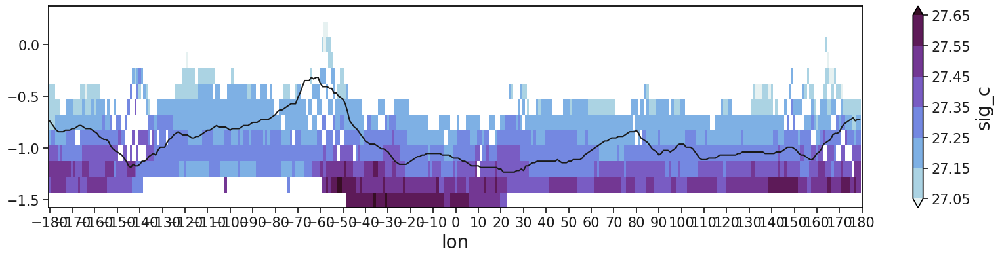

In [24]:
si_x = 15

hmp = ds_ssh2.sig_c.plot(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',figsize=(20,4),levels=7)
wrap_smth_var((ds_ssh2.sic - si_x).__abs__().idxmin(dim='adt'),nx=10).plot(x='lon',c='k')

plt.xticks(np.arange(-180,190,10))

plt.show()



# paper plots

In [5]:
ds_ssh = xr.open_dataset(f'ssh_smth_0.1m_adt.nc')

In [6]:
ds_ssh2 = xr.open_dataset(f'ssh_smth_0.15m_adt.nc')

In [13]:
import importlib
importlib.reload(sys.modules['plot_formatting'])
from plot_formatting import *

In [6]:
def add_bathym_labels(fig,ax,y=1.1,**kwargs):
    for s,x in zip(['PAR', 'SSA', 'SWIR', 'KP', 'SEIR'],((np.asarray([-145,-30,25,79,145,])+180)%360)/360):
        fig.text(x=x,y=y,s=s,transform=ax.transAxes,ha='center',fontsize=20,**kwargs)

In [7]:
alphbt = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm',
          'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']

In [20]:
fig,ax = plt.subplots(3,1,figsize=[14,12],constrained_layout=True,sharex='col',sharey='row',
                      subplot_kw={'facecolor':'darkgrey'},dpi=600)
ax = ax.flatten()

sig_kwargs = dict(x='lon',vmin=27.05,vmax=27.65,cmap='cmo.dense',add_colorbar=False,) #levels=7)

hmp = ds_ww.sig_c.mean('season').plot(**sig_kwargs,ax=ax[0])
#cb  = fig.colorbar(hmp,ax=ax[0],label='Core Density,\n$\sigma_0$ (kg m$^{-3}$)')
#cb.ax.invert_yaxis()


# plot bathym features
b = bth.elevation.plot.contour(x='lon',levels=[-1e3,-2e3,-3e3],colors='#f8f800',
                                linestyles=['-'],linewidths=1.2,alphas=0.1,ax=ax[0])
# plot sea ice
#si_x = 15
#ice = wrap_smth_var((si.sic - si_x).__abs__().idxmin(dim='lat').mean('season'),nx=20
 #                          ).plot(ax=ax[0],c='w',lw=2)

# plot adt
adt = ssh.adt.mean('season').plot.contour(x='lon',levels=np.arange(-1.5,0.2,0.15),colors='#0ca508',
                                          linestyles='-',linewidths=1.25,ax=ax[1])
hmp = ds_ssh2.sig_c.plot(**sig_kwargs,ax=ax[2])

cb = fig.colorbar(hmp,ax=ax,
                  location='bottom',shrink=0.65,aspect=12*3.5,pad=0.02)
cb.set_label(label='Core Density $\sigma_0$, (kg m$^{-3}$)',fontsize=20)
cb.ax.invert_xaxis()

# make colourmap for bathym
cm = mpl.colors.LinearSegmentedColormap.from_list("", ['#ededed','#ededed'])
for i,a in enumerate(ax):
    # plot coastline
    if i!=2:
        bth.elevation.plot.contour(x='lon',levels=[0],colors='k',linestyles=['-'],linewidths=[1.5],ax=a)
        bth.elevation.where(bth.elevation>0).plot(x='lon',cmap=cm,ax=a,add_colorbar=False,)
        ds.adt.mean('season').plot.contour(x='lon',levels=[-0.58,-0.1],colors='k',linestyles=['-'],linewidths=[1.4],ax=a)
                
    a.set_xlabel('')
    a.set_ylabel('Latitude (°N)')
    a.set_ylim(-80,-45)
    a.set_yticks(np.arange(-70,-40,10))
    add_bathym_vlines(a,l_kwargs={'c':'#e41a1c','ls':'--','lw':2,'alpha':0.7})
    a.text(x=0.005,y=.925,s="(" + alphbt[i] + ")",transform=a.transAxes)

#add_bathym_labels(fig,ax[-1],y=0.925,zorder=10,c='k',weight='bold')
add_bathym_labels(fig,ax[0],y=1.025,zorder=10,c='k',weight='bold')
    
ax[-1].axhline(-0.58,c='k',lw=1.5)
ax[-1].axhline(-0.1, c='k',lw=1.5)
ax[-1].set_xlabel('Longitude (°E)')
ax[-1].set_ylabel('ADT (m)')
ax[-1].set_ylim(-1.55,0.05)
ax[-1].set_yticks(np.arange(-1.5,0.1,0.5))

fig.show()